In [202]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
%matplotlib inline

from sklearn.preprocessing import OneHotEncoder, StandardScaler

from sklearn.impute import MissingIndicator, SimpleImputer

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn import svm

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.feature_selection import SelectFromModel
from sklearn.dummy import DummyClassifier

# plot_confusion_matrix is a handy visual tool, added in the latest version of scikit-learn
# if you are running an older version, comment out this line and just use confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_roc_curve


from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbPipeline


import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
import json

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import time

import warnings
warnings.filterwarnings('ignore')

In [205]:
X_train = pd.read_csv('../data/X_train.csv')
X_test = pd.read_csv('../data/X_test.csv')
y_train = pd.read_csv('../data/y_train.csv')

In [206]:
xy_train = X_train.merge(y_train, on='id', how='inner')

In [232]:
xy_train['region'].value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [200]:
xy_train.shape

(59400, 41)

In [201]:
print('Number of X_train duplicates: {}'.format(len(xy_train[xy_train.duplicated()])))
print('Number of X_test duplicates: {}'.format(len(X_test[X_test.duplicated()])))

Number of X_train duplicates: 0
Number of X_test duplicates: 0


In [195]:
X_train.shape

(59400, 32)

In [73]:
X_test.shape

(14850, 40)

In [74]:
59400+14850

74250

In [75]:
y_train.shape

(59400, 2)

In [76]:
14850 / (59400 + 14850) # There was an 80/20 split done

0.2

In [77]:
X_train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [78]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [79]:
X_train.isna().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [233]:
X_train['construction_year'].value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [81]:
y_train['status_group'].value_counts() #May need to use SMOTE for the imbalance

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

# Handle NAs

#### Funder

In [82]:
X_train[X_train['funder'].isna()]

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
34,41583,0.0,2011-02-23,NaN,-41,NaN,39.812912,-7.889986,Msikitini Wa Ijumaa,0,...,never pay,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
43,19282,0.0,2013-01-15,NaN,1642,NaN,34.967789,-4.628921,Mvae Primary,0,...,unknown,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe
47,13620,0.0,2011-07-27,NaN,0,NaN,33.540607,-9.172905,Mahakamani,0,...,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
65,51072,0.0,2013-02-09,NaN,1415,NaN,34.621598,-5.173136,Nyambi,0,...,unknown,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe
71,17386,0.0,2011-03-31,NaN,0,NaN,34.462228,-8.575780,Kwa Manyusi Mlilo,0,...,never pay,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59357,46563,0.0,2013-02-19,NaN,1635,NaN,34.971841,-5.098362,Shabani,0,...,unknown,unknown,unknown,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump
59366,55232,0.0,2013-02-02,NaN,1541,NaN,34.765729,-5.027725,Joshoni,0,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump
59370,14796,200.0,2013-01-29,NaN,1154,NaN,30.058731,-4.902633,Village Office,0,...,monthly,unknown,unknown,unknown,unknown,unknown,other,unknown,other,other
59376,34716,0.0,2013-02-03,NaN,1581,NaN,34.821039,-5.076258,Nasingo,0,...,unknown,unknown,unknown,dry,dry,shallow well,shallow well,groundwater,other,other


In [83]:
X_train['funder'].fillna(value='Unknown', inplace=True)

#### Installer

In [84]:
X_train['installer'].fillna(value='Unknown', inplace=True)

#### Subvillage (Still unsure how to handle)

In [85]:
X_train[X_train['subvillage'].isna()].iloc[:,:20]

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by
342,21127,0.0,2011-03-16,Government Of Tanzania,0,North,36.557631,-6.233394,Kwa Mihinzo,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Sagara,0,True,GeoData Consultants Ltd
360,51558,0.0,2011-03-25,Commu,0,Commu,36.416701,-6.220157,Kwa Emanuel,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Kongwa Urban,0,True,GeoData Consultants Ltd
379,53847,0.0,2011-03-20,World Bank,0,Rhobi,36.729383,-6.084255,Kwa Dimanyi,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Pandambili,0,True,GeoData Consultants Ltd
565,27334,0.0,2011-03-18,World Bank,0,Rhoda,36.696881,-5.993192,Mpande,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Njoge,0,True,GeoData Consultants Ltd
966,17088,0.0,2011-03-11,Water,0,Commu,36.322623,-6.030500,Kwa Charles,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Sejeli,0,True,GeoData Consultants Ltd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59008,16353,0.0,2011-03-23,Commu,0,Commu,36.770490,-6.288555,Kwa Mlima,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Mlali,0,True,GeoData Consultants Ltd
59091,45206,0.0,2011-03-14,Lvia,0,Commu,36.407974,-5.715084,Kwa Emson,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Zoissa,0,True,GeoData Consultants Ltd
59105,12248,0.0,2011-03-19,World Bank,0,Rhobi,36.889359,-5.959966,Kwa Mahimbo,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Pandambili,0,True,GeoData Consultants Ltd
59215,46441,0.0,2011-03-19,World Bank,0,Rhobi,36.854216,-6.010508,Kwa Sila,0,Wami / Ruvu,NaN,Dodoma,1,3,Kongwa,Pandambili,0,True,GeoData Consultants Ltd


In [86]:
subvillage = X_train[X_train['basin'] == 'Wami / Ruvu']

#subvillage.groupby(['basin', 'subvillage']).sum()

In [87]:
subvillage.groupby(['region', 'subvillage']).sum()

id  amount_tsh  gps_height  longitude  \
region        subvillage                                              
Dar es Salaam Amani Gomvu  47940         0.0          -2  39.481425   
              Azimio       71507       100.0         107  39.135178   
              Basihaya       735        50.0         -19  39.162534   
              Bondeni      55322        50.0         -19  39.534599   
              Buyuni       49097        50.0         -52  39.521571   
...                          ...         ...         ...        ...   
Tanga         Tingeni      43504         0.0           0  37.294360   
              Tuliani      39780      2400.0           0  74.947131   
              Ungulodi     53474         0.0           0  37.151898   
              Vulala       71047         0.0           0  37.639017   
              Walambe      21697      1000.0           0  37.201491   

                            latitude  num_private  region_code  district_code  \
region        subvillage                                                        
Dar es Salaam Amani Gomvu  -6.935378            0            7              3   
              Azimio       -6.709691            0            7              1   
              Basihaya     -6.638992            0            7              1   
              Bondeni      -7.088183            0            7              3   
              Buyuni       -7.128883            0            7              3   
...                              ...          ...          ...            ...   
Tanga         Tingeni      -5.698781            0            4              7   
              Tuliani     -10.744890            0            8             14   
              Ungulodi     -6.019752            0            5              1   
              Vulala       -5.785670            0            4              7   
              Walambe      -6.048222            0            5              1   

                           population  construction_year  
region        subvillage                                  
Dar es Salaam Amani Gomvu         203               1970  
              Azimio             2569               2010  
              Basihaya           4520               1990  
              Bondeni              50               2000  
              Buyuni               50               2000  
...                               ...                ...  
Tanga         Tingeni            1534               1989  
              Tuliani             381               3984  
              Ungulodi            800               2010  
              Vulala             1009               1992  
              Walambe             280               1995  

[1838 rows x 10 columns]

In [219]:
X_train['region_code'].value_counts()

11    5300
17    5011
12    4639
3     4379
5     4040
18    3324
19    3047
2     3024
16    2816
10    2640
4     2513
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: region_code, dtype: int64

In [88]:
X_train['subvillage'].fillna(value='Unknown', inplace=True)

#### Public Meeting

In [89]:
X_train['public_meeting'].value_counts()

True     51011
False     5055
Name: public_meeting, dtype: int64

In [90]:
X_train['public_meeting'].fillna(value='False', inplace=True)

#### Scheme Management

In [91]:
X_train['scheme_management'].value_counts()

VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
None                    1
Name: scheme_management, dtype: int64

In [92]:
X_train['scheme_management'].fillna(value='Unknown', inplace=True)

#### Scheme Name

In [93]:
X_train.drop('scheme_name',axis='columns', inplace=True) # over 50% nulls

#### Permit

In [94]:
X_train['permit'].value_counts()

True     38852
False    17492
Name: permit, dtype: int64

In [95]:
X_train['permit'].fillna(value='False', inplace=True)

In [96]:
X_train['installer'].value_counts()

DWE             17402
Unknown          3658
Government       1825
RWE              1206
Commu            1060
                ...  
Hesewa              1
world vision        1
RC Msufi            1
Matyenye            1
George mtoto        1
Name: installer, Length: 2145, dtype: int64

In [97]:
X_train['installer'].replace('0', 'Unknown', inplace=True)

# Deal with outliers

#### Construction Year (may need to revisit. I used mean value to rplace the zeros, which there were 20,000)

In [98]:
X_train['construction_year'].value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [99]:
X_train['construction_year'].replace(0, X_train[X_train['construction_year'] != 0]['construction_year'].mean(), inplace=True)

#### Population

In [100]:
X_train.groupby('basin').mean('population')['population']

basin
Internal                   167.359409
Lake Nyasa                  58.645034
Lake Rukwa                 163.612469
Lake Tanganyika            262.256685
Lake Victoria              130.765027
Pangani                    172.472036
Rufiji                     170.301906
Ruvuma / Southern Coast    274.193635
Wami / Ruvu                254.710205
Name: population, dtype: float64

In [101]:
X_train['population'].replace(0, X_train['population'].mean(), inplace=True)

#### GPS Height

In [102]:
X_train[X_train['gps_height'] <= -1]

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
34,41583,0.0,2011-02-23,Unknown,-41,Unknown,39.812912,-7.889986,Msikitini Wa Ijumaa,0,...,never pay,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
152,60983,0.0,2013-03-16,0,-15,Unknown,39.527114,-6.988748,Msikitini,0,...,never pay,salty,salty,dry,dry,machine dbh,borehole,groundwater,other,other
181,68908,0.0,2011-03-05,Unknown,-21,Unknown,39.670943,-7.906606,Royal,0,...,never pay,soft,good,enough,enough,machine dbh,borehole,groundwater,communal standpipe,communal standpipe
184,2136,0.0,2011-02-22,Unknown,-16,Unknown,39.854320,-7.783063,Mvivini,0,...,never pay,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
249,35193,0.0,2011-03-16,Amref,-19,AMREF,39.244178,-7.368293,Kwa,0,...,never pay,soft,good,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59200,20017,0.0,2013-02-08,Amref,-3,Amref,40.160806,-10.578354,Kwa Rashid Haya,0,...,unknown,soft,good,enough,enough,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
59243,3396,50.0,2013-03-16,0,-20,Unknown,39.524021,-6.984802,Kwa Mariwala,0,...,per bucket,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
59251,65997,0.0,2013-01-24,Serikali,-37,Serikali,39.736299,-9.884813,Kwa Asha Mgugi,0,...,unknown,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe multiple,communal standpipe
59351,55322,50.0,2013-03-18,0,-19,Unknown,39.534599,-7.088183,Kwa China,0,...,per bucket,soft,good,enough,enough,machine dbh,borehole,groundwater,communal standpipe,communal standpipe


In [103]:
X_train['gps_height'].replace(0, X_train['gps_height'].mean(), inplace=True)

#### Longitude and latitude - There are 1812 rows that have a longitude of 0 and a latitude of -2.000000e-08 which lies outside of Tanzania. We replaced those rows with the mean values of lat and long. 

In [104]:
X_train.loc[X_train['longitude']==0] 

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
21,6091,0.0,2013-02-10,Dwsp,668.297239,DWE,0.0,-2.000000e-08,Muungano,0,...,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump
53,32376,0.0,2011-08-01,Government Of Tanzania,668.297239,Government,0.0,-2.000000e-08,Polisi,0,...,unknown,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
168,72678,0.0,2013-01-30,Wvt,668.297239,WVT,0.0,-2.000000e-08,Wvt Tanzania,0,...,other,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
177,56725,0.0,2013-01-17,Netherlands,668.297239,DWE,0.0,-2.000000e-08,Kikundi Cha Wakina Mama,0,...,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,other,other
253,13042,0.0,2012-10-29,Hesawa,668.297239,DWE,0.0,-2.000000e-08,Kwakisusi,0,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59189,62177,0.0,2011-07-18,Dwsp,668.297239,DWE,0.0,-2.000000e-08,Wazazo,0,...,other,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
59208,3631,0.0,2013-01-22,Dwsp,668.297239,DWE,0.0,-2.000000e-08,Mtakuja,0,...,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
59295,60843,0.0,2011-07-19,Rwssp,668.297239,DWE,0.0,-2.000000e-08,Maendeleo,0,...,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
59324,748,0.0,2013-01-22,World Vision,668.297239,World Vision,0.0,-2.000000e-08,Mwazwilo,0,...,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump


In [105]:
X_train['longitude'].replace(to_replace = 0 , value =np.mean(X_train['longitude']), inplace=True)

#### Latitude

In [106]:
X_train.loc[X_train['latitude']==-2e-08] 

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
21,6091,0.0,2013-02-10,Dwsp,668.297239,DWE,34.077427,-2.000000e-08,Muungano,0,...,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump
53,32376,0.0,2011-08-01,Government Of Tanzania,668.297239,Government,34.077427,-2.000000e-08,Polisi,0,...,unknown,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
168,72678,0.0,2013-01-30,Wvt,668.297239,WVT,34.077427,-2.000000e-08,Wvt Tanzania,0,...,other,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
177,56725,0.0,2013-01-17,Netherlands,668.297239,DWE,34.077427,-2.000000e-08,Kikundi Cha Wakina Mama,0,...,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,other,other
253,13042,0.0,2012-10-29,Hesawa,668.297239,DWE,34.077427,-2.000000e-08,Kwakisusi,0,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59189,62177,0.0,2011-07-18,Dwsp,668.297239,DWE,34.077427,-2.000000e-08,Wazazo,0,...,other,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
59208,3631,0.0,2013-01-22,Dwsp,668.297239,DWE,34.077427,-2.000000e-08,Mtakuja,0,...,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
59295,60843,0.0,2011-07-19,Rwssp,668.297239,DWE,34.077427,-2.000000e-08,Maendeleo,0,...,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
59324,748,0.0,2013-01-22,World Vision,668.297239,World Vision,34.077427,-2.000000e-08,Mwazwilo,0,...,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump


In [107]:
X_train['latitude'].replace(to_replace = -2.000000e-08 , value =np.mean(X_train['latitude']), inplace=True)

# Remove Uneeded columns

In [108]:
len(X_train[X_train['amount_tsh'] == 0.0])

41639

In [109]:
41639/59400

0.700993265993266

In [110]:
len(X_train[X_train['num_private'] == 0.0])

58643

In [111]:
58643/59400

0.9872558922558923

In [112]:
X_train['region'].value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [113]:
X_train['region_code'].value_counts()

11    5300
17    5011
12    4639
3     4379
5     4040
18    3324
19    3047
2     3024
16    2816
10    2640
4     2513
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: region_code, dtype: int64

In [114]:
X_train.groupby('region').count()['region_code']

region
Arusha           3350
Dar es Salaam     805
Dodoma           2201
Iringa           5294
Kagera           3316
Kigoma           2816
Kilimanjaro      4379
Lindi            1546
Manyara          1583
Mara             1969
Mbeya            4639
Morogoro         4006
Mtwara           1730
Mwanza           3102
Pwani            2635
Rukwa            1808
Ruvuma           2640
Shinyanga        4982
Singida          2093
Tabora           1959
Tanga            2547
Name: region_code, dtype: int64

In [115]:
X_train['quantity_group'].value_counts()

enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity_group, dtype: int64

In [116]:
X_train['quantity'].value_counts()

enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity, dtype: int64

In [117]:
X_train['source_type'].value_counts()

spring                  17021
shallow well            16824
borehole                11949
river/lake              10377
rainwater harvesting     2295
dam                       656
other                     278
Name: source_type, dtype: int64

In [118]:
X_train['source'].value_counts()

spring                  17021
shallow well            16824
machine dbh             11075
river                    9612
rainwater harvesting     2295
hand dtw                  874
lake                      765
dam                       656
other                     212
unknown                    66
Name: source, dtype: int64

In [119]:
X_train['source'].replace(to_replace='unknown', value='other', inplace=True)

In [120]:
X_train['payment_type'].value_counts()

never pay     25348
per bucket     8985
monthly        8300
unknown        8157
on failure     3914
annually       3642
other          1054
Name: payment_type, dtype: int64

In [121]:
X_train['payment'].value_counts()

never pay                25348
pay per bucket            8985
pay monthly               8300
unknown                   8157
pay when scheme fails     3914
pay annually              3642
other                     1054
Name: payment, dtype: int64

In [122]:
X_train['waterpoint_type_group'].value_counts()

communal standpipe    34625
hand pump             17488
other                  6380
improved spring         784
cattle trough           116
dam                       7
Name: waterpoint_type_group, dtype: int64

In [123]:
X_train['waterpoint_type'].value_counts()

communal standpipe             28522
hand pump                      17488
other                           6380
communal standpipe multiple     6103
improved spring                  784
cattle trough                    116
dam                                7
Name: waterpoint_type, dtype: int64

In [124]:
X_train['extraction_type_group'].value_counts()

gravity            26780
nira/tanira         8154
other               6430
submersible         6179
swn 80              3670
mono                2865
india mark ii       2400
afridev             1770
rope pump            451
other handpump       364
other motorpump      122
wind-powered         117
india mark iii        98
Name: extraction_type_group, dtype: int64

In [125]:
X_train['extraction_type'].value_counts()

gravity                      26780
nira/tanira                   8154
other                         6430
submersible                   4764
swn 80                        3670
mono                          2865
india mark ii                 2400
afridev                       1770
ksb                           1415
other - rope pump              451
other - swn 81                 229
windmill                       117
india mark iii                  98
cemo                            90
other - play pump               85
walimi                          48
climax                          32
other - mkulima/shinyanga        2
Name: extraction_type, dtype: int64

In [126]:
X_train['extraction_type_class'].value_counts()

gravity         26780
handpump        16456
other            6430
submersible      6179
motorpump        2987
rope pump         451
wind-powered      117
Name: extraction_type_class, dtype: int64

In [127]:
X_train['recorded_by'].value_counts()

GeoData Consultants Ltd    59400
Name: recorded_by, dtype: int64

In [128]:
#Need to add back in id
X_train.drop(['amount_tsh', 'num_private', 'region', 'quantity_group', 
              'source_type', 'payment_type', 'waterpoint_type_group', 
              'extraction_type_group', 'extraction_type_class','recorded_by'], 
               axis = 'columns', inplace=True)

#### Reasons for removal: 

id is not a useful predictor

amount_tsh is ~70% zeros

num_private is ~99% zeros

region is the same as region_code but we will keep region code becasue it is already numeric and ready for our models.

quantity_group has the same values and value counts as quantity

source_type has roughly the same categories as source, but source has the categories broken out better (river and lake are seperated in source)

payment_type has the same values and value counts as payment

waterpoint_type_group has the same values and value counts as waterpoint_type

extraction_type_group has roughly the same categories as extraction_type, but extraction_type has the categories broken out better

extraction_type_class has even even less catagories than extraction_type_group

recorded_by has just one value, "GeoData Consultants Ltd", so it would not be useful in EDA or prediction.

In [129]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 59400 non-null  int64  
 1   date_recorded      59400 non-null  object 
 2   funder             59400 non-null  object 
 3   gps_height         59400 non-null  float64
 4   installer          59400 non-null  object 
 5   longitude          59400 non-null  float64
 6   latitude           59400 non-null  float64
 7   wpt_name           59400 non-null  object 
 8   basin              59400 non-null  object 
 9   subvillage         59400 non-null  object 
 10  region_code        59400 non-null  int64  
 11  district_code      59400 non-null  int64  
 12  lga                59400 non-null  object 
 13  ward               59400 non-null  object 
 14  population         59400 non-null  float64
 15  public_meeting     59400 non-null  object 
 16  scheme_management  594

In [130]:
X_train['public_meeting'].value_counts()

True     51011
False     5055
False     3334
Name: public_meeting, dtype: int64

# Feature Engineering

#### Date Columns

date_recorded

construction_year

In [131]:
X_train['date_recorded'] = pd.to_datetime(X_train['date_recorded'])

In [132]:
#Create the month and month number column from the date column
X_train['month_recorded'] = X_train['date_recorded'].dt.month_name()
X_train['month_num_recorded'] = X_train['date_recorded'].dt.month

In [133]:
#Create the month and month number column from the date column
X_train['year_recorded'] = X_train['date_recorded'].dt.year

# Exploratory Data Analysis

In [134]:
#set the style of our charts
mpl.style.use('fivethirtyeight')

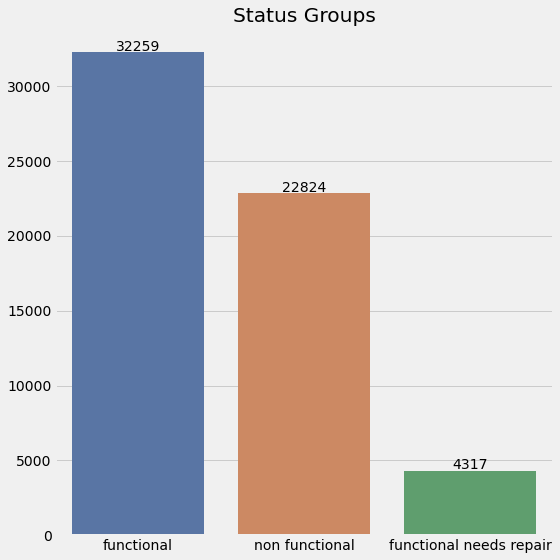

In [135]:
fig2, ax = plt.subplots(figsize = (8,8))

x = y_train['status_group'].value_counts().index
y = y_train['status_group'].value_counts().values

ax = sns.barplot(x,y,palette='deep')

#ax.set_xlabel("Status Group")
ax.set_title('Status Groups')

plt.ticklabel_format(style = 'plain', axis = 'y')
plt.tight_layout()


for p in ax.patches:
 # get the height of each bar
 height = p.get_height()
 # adding text to each bar
 ax.text(x = p.get_x()+(p.get_width()/2), # x-coordinate position of data label, padded to be in the middle of the bar
 y = height+100, # y-coordinate position of data label, padded 100 above bar
 s = '{:.0f}'.format(height), # data label, formatted to ignore decimals
 ha = 'center') # sets horizontal alignment (ha) to center
    
    
    
#fig.savefig('images/sales_per_waterfront.png');



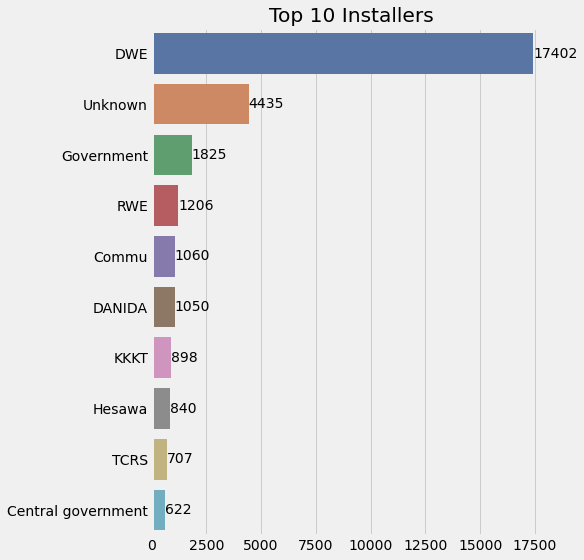

In [136]:
fig2, ax = plt.subplots(figsize = (8,8))

y = X_train['installer'].value_counts().index[:10]
x = X_train['installer'].value_counts().values[:10]

ax = sns.barplot(x,y,palette='deep', orient='h')

#ax.set_xlabel("Status Group")
ax.set_title('Top 10 Installers')

#plt.ticklabel_format(style = 'plain', axis = 'y')
plt.tight_layout()
#ax.tick_params(axis='x', labelrotation = 90)

for p in ax.patches:
    height = p.get_height() # height of each horizontal bar is the same
    width = p.get_width() # width (average number of passengers)
 # adding text to each bar
    ax.text(x = width+3, # x-coordinate position of data label, padded 3 to right of bar
    y = p.get_y()+(height/2), # # y-coordinate position of data label, padded to be in the middle of the bar
    s = '{:.0f}'.format(width), # data label, formatted to ignore decimals
    va = 'center') # sets vertical alignment (va) to center
    
    
    
#fig.savefig('images/sales_per_waterfront.png');

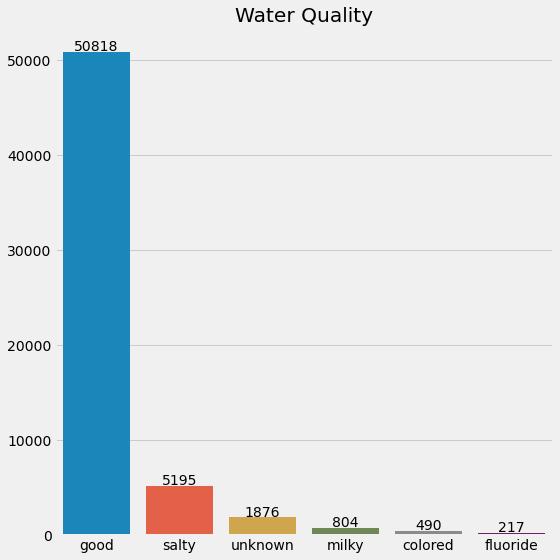

In [137]:
fig2, ax = plt.subplots(figsize = (8,8))

x = X_train['quality_group'].value_counts().index
y = X_train['quality_group'].value_counts().values

ax = sns.barplot(x,y)

#ax.set_xlabel("Status Group")
ax.set_title('Water Quality')
plt.ticklabel_format(style = 'plain', axis = 'y')
plt.tight_layout()


for p in ax.patches:
 # get the height of each bar
 height = p.get_height()
 # adding text to each bar
 ax.text(x = p.get_x()+(p.get_width()/2), # x-coordinate position of data label, padded to be in the middle of the bar
 y = height+100, # y-coordinate position of data label, padded 100 above bar
 s = '{:.0f}'.format(height), # data label, formatted to ignore decimals
 ha = 'center') # sets horizontal alignment (ha) to center
    
    
    
#fig.savefig('images/sales_per_waterfront.png');

In [138]:
xy_train = X_train.set_index('id').join(y_train.set_index('id'))

In [188]:
xy_train.groupby(['quality_group', 'status_group']).count()

date_recorded  funder  gps_height  \
quality_group status_group                                                 
colored       functional                         246     246         246   
              functional needs repair             54      54          54   
              non functional                     190     190         190   
fluoride      functional                         157     157         157   
              functional needs repair             13      13          13   
              non functional                      47      47          47   
good          functional                       28760   28760       28760   
              functional needs repair           3904    3904        3904   
              non functional                   18154   18154       18154   
milky         functional                         438     438         438   
              functional needs repair             14      14          14   
              non functional                     352     352         352   
salty         functional                        2394    2394        2394   
              functional needs repair            297     297         297   
              non functional                    2504    2504        2504   
unknown       functional                         264     264         264   
              functional needs repair             35      35          35   
              non functional                    1577    1577        1577   

                                       installer  longitude  latitude  \
quality_group status_group                                              
colored       functional                     246        246       246   
              functional needs repair         54         54        54   
              non functional                 190        190       190   
fluoride      functional                     157        157       157   
              functional needs repair         13         13        13   
              non functional                  47         47        47   
good          functional                   28760      28760     28760   
              functional needs repair       3904       3904      3904   
              non functional               18154      18154     18154   
milky         functional                     438        438       438   
              functional needs repair         14         14        14   
              non functional                 352        352       352   
salty         functional                    2394       2394      2394   
              functional needs repair        297        297       297   
              non functional                2504       2504      2504   
unknown       functional                     264        264       264   
              functional needs repair         35         35        35   
              non functional                1577       1577      1577   

                                       wpt_name  basin  subvillage  \
quality_group status_group                                           
colored       functional                    246    246         246   
              functional needs repair        54     54          54   
              non functional                190    190         190   
fluoride      functional                    157    157         157   
              functional needs repair        13     13          13   
              non functional                 47     47          47   
good          functional                  28760  28760       28760   
              functional needs repair      3904   3904        3904   
              non functional              18154  18154       18154   
milky         functional                    438    438         438   
              functional needs repair        14     14          14   
              non functional                352    352         352   
salty         functional                   2394   2394        2394   
       

Text(0.5, 1.0, 'Water Quality')

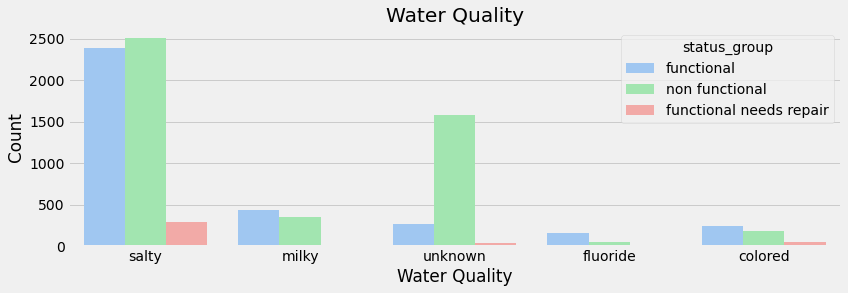

In [189]:
xy_train = xy_train[xy_train['quality_group'] != 'good']

fig, ax = plt.subplots(figsize = (12,4))
ax = sns.countplot(x="quality_group", hue="status_group", data=xy_train)
ax.set_xlabel("Water Quality");
plt.ticklabel_format(style = 'plain', axis = 'y')
plt.tight_layout()
ax.set_ylabel("Count");
ax.set_title("Water Quality")

In [213]:
no0 = xy_train[xy_train['population'] != 0]

In [290]:
top_300_installers = list(xy_train['installer'].value_counts().index[0:300])
top_300_df = xy_train[xy_train['installer'].isin(top_300_installers)]
top_300_df

def is_functional(row):
    if row == 'functional':
        return 1
    else:
        return 0
    
top_300_df['functional'] = top_300_df['status_group'].apply(is_functional)
top_300_df['count'] = top_300_df.groupby('installer')['id'].transform(lambda grp: len(grp))
top_300_grouped = top_300_df.groupby('installer').mean()
top_300_grouped = top_300_grouped.sort_values(by='functional').head(200)

In [291]:
top_300_grouped[top_300_grouped['count'] > 100]

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,functional,count
installer,,,,,,,,,,,,
FW,36355.323699,4.913295,346.520231,38.837889,-10.745398,0.000000,90.000000,33.000000,144.485549,1968.728324,0.075145,173.0
Fini Water,39105.281879,172.348993,241.489933,39.029465,-10.318965,0.046980,8.302013,3.604027,318.134228,1504.731544,0.100671,149.0
FINI WATER,34105.029126,13.495146,293.864078,38.962413,-10.104152,0.000000,80.000000,53.000000,674.883495,1942.747573,0.126214,103.0
Centr,41565.629630,0.864198,11.197531,36.723746,-5.814732,0.074074,17.753086,15.765432,34.734568,561.302469,0.129630,162.0
Fini water,38077.473684,21.052632,50.180451,39.943484,-10.393430,0.000000,95.571429,12.007519,628.954887,1967.308271,0.157895,133.0
...,...,...,...,...,...,...,...,...,...,...,...,...
Commu,37048.052830,363.915094,1218.598113,34.946197,-7.991016,0.000000,6.943396,3.459434,0.000000,1177.874528,0.683019,1060.0
JICA,41495.893805,30.707965,140.132743,24.120238,-4.547279,0.000000,30.327434,12.053097,83.442478,710.345133,0.690265,113.0
Community,37438.763110,349.511754,1258.524412,34.673979,-3.440929,0.000000,6.381555,5.792043,174.244123,1831.374322,0.698011,553.0


In [ ]:
installer_dict = {}
for installer in top_300_installers:
    installer_dict[installer] = {'functional'}

Text(0.5, 1.0, 'Status Group')

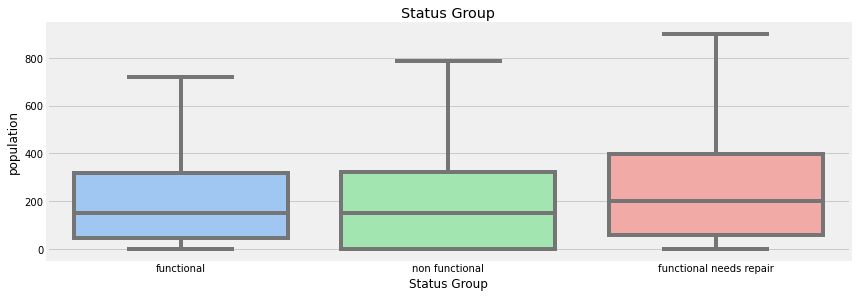

In [218]:
fig, ax = plt.subplots(figsize = (12,4))
ax = sns.boxplot(x="status_group", y='population', data=no0, showfliers=False)
ax.set_xlabel("Status Group");
plt.tight_layout()
ax.set_title("Status Group")

In [163]:

hmap = folium.Map(location=[X_train['latitude'].median(), X_train['longitude'].median()], zoom_start=6, )
folium.TileLayer('stamenterrain').add_to(hmap)


locations = X_train[['latitude', 'longitude']]
locationlist = locations.values.tolist()

marker_cluster = MarkerCluster().add_to(hmap)

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(marker_cluster)
hmap


# Train test split

In [177]:
# for EDA
xy_train = X_train.set_index('id').join(y_train.set_index('id'))


#for train_test split
X = xy_train.drop(columns = 'status_group', axis=1)
y = xy_train['status_group']


#Since we dont have y_test, we need to create it here doing a split off of the x and y train.
X_t, X_v, y_t, y_v = train_test_split(X, y, test_size = .2, random_state=42)

# Modeling - Baselines

#### Dummy Guess Baseline ( If we guessed the most common label everytime, we would be right 54% of the time)

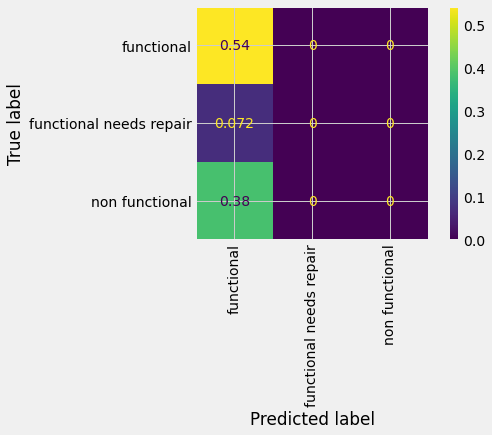

In [178]:
mpl.style.use('seaborn-pastel')
plot_confusion_matrix(DummyClassifier(strategy="most_frequent").fit(X_t, y_t), X_v, y_v, xticks_rotation='vertical', normalize = 'all');

#### Baselines with no Hyperparameters

In [179]:
#public_meeting and permit need to be included in the numeric features. They are boolean and need to be converted to ints. Theys will not work in categorical features as booleans.
X_t['public_meeting'] = (X_t['public_meeting'] == 'TRUE').astype(int)
X_t['permit'] = (X_t['permit'] == 'TRUE').astype(int)

numericals = X_t.select_dtypes(include=['int64', 'float64'])

X_t_nums = numericals

for col in X_t_nums:
    X_t_nums[col] = X_t_nums[col].astype('float64')

In [180]:
categoricals = X_t.select_dtypes(include= 'object')

X_t_cat = categoricals[['management','payment','water_quality', 'quality_group', 'quantity', 'source', 'source_class', 'waterpoint_type']]

for col in X_t_cat:
    X_t_cat[col] = X_t_cat[col].astype('str')

In [181]:
X_t_clean = pd.concat([X_t_nums, X_t_cat], axis=1)

categoricals.head()

,funder,installer,wpt_name,basin,subvillage,lga,ward,scheme_management,extraction_type,management,management_group,payment,water_quality,quality_group,quantity,source,source_class,waterpoint_type,month_recorded
id,,,,,,,,,,,,,,,,,,,
454,Dmdd,DMDD,Narmo,Internal,Bashnet Kati,Babati,Bashinet,Water Board,gravity,water board,user-group,pay per bucket,soft,good,insufficient,spring,groundwater,communal standpipe,February
510,Cmsr,Gove,Lukali,Internal,Lukali,Bahi,Lamaiti,VWC,india mark ii,vwc,user-group,never pay,soft,good,enough,shallow well,groundwater,hand pump,March
14146,Kkkt,KKKT,Mahakama,Lake Rukwa,Chawalikozi,Mbozi,Ndalambo,VWC,other,vwc,user-group,never pay,soft,good,enough,shallow well,groundwater,other,July
47410,Unknown,Unknown,Shule Ya Msingi Chosi A,Rufiji,Shuleni,Mbarali,Chimala,VWC,gravity,vwc,user-group,pay monthly,soft,good,insufficient,river,surface,communal standpipe,April
1288,Ki,Ki,Kwa Mjowe,Wami / Ruvu,Ngholong,Kilosa,Chakwale,VWC,other,vwc,user-group,pay when scheme fails,salty,salty,enough,shallow well,groundwater,other,April


In [182]:
numerical_pipeline = Pipeline(steps=[
    ('ss', StandardScaler())
])
                
categorical_pipeline = Pipeline(steps=[
    ('ohe', OneHotEncoder(categories='auto',
                          drop='first',
                          sparse=False))
])

trans = ColumnTransformer(transformers=[
    ('numerical', numerical_pipeline, X_t_nums.columns),
    ('categorical', categorical_pipeline, X_t_cat.columns)
])

In [183]:
base_pipe_lr = Pipeline([('trans', trans),
                    ('LR', LogisticRegression(random_state=42))])

base_pipe_dt = Pipeline([('trans', trans),
                    ('DT', DecisionTreeClassifier(random_state=42))])

base_pipe_rf = Pipeline([('trans', trans),
                    ('RF', RandomForestClassifier(random_state=42))])

base_pipe_knn = Pipeline([('trans', trans),
                    ('KNN', KNeighborsClassifier())])

base_pipe_svm = Pipeline([('trans', trans),
                     ('SVM', svm.SVC(random_state=42))])

base_pipe_xgb = Pipeline([('trans', trans),
                     ('XGB', XGBClassifier(random_state=42))])

In [184]:
base_pipes = [base_pipe_lr, base_pipe_dt, base_pipe_rf, base_pipe_knn, base_pipe_svm, base_pipe_xgb]

In [185]:
start = time.time()

for pipe in base_pipes:
    pipe.fit(X_t,y_t)
    
end = time.time()
print('Time it took to run the fittings: {}'.format(end-start))

Time it took to run the fittings: 343.6565670967102


In [173]:
start = time.time()

for pipe in base_pipes:
    pipe.score(X_t,y_t)
    
end = time.time()
print('Time it took to run the fittings: {}'.format(end-start))

Time it took to run the fittings: 178.14255595207214


In [174]:
grid_dict = {0: 'Logistic Regression', 1: 'Decision Trees', 
             2: 'Random Forest', 3: 'K-Nearest Neighbors', 
             4: 'Support Vector Machines', 5: 'XGBoost'}

In [175]:
for i, model in enumerate(base_pipes):
    print('{} Training Accuracy: {}'.format(grid_dict[i], model.score(X_t,y_t)))

Logistic Regression Training Accuracy: 0.7257996632996633
Decision Trees Training Accuracy: 0.9952861952861953
Random Forest Training Accuracy: 0.9952230639730639
K-Nearest Neighbors Training Accuracy: 0.8314814814814815
Support Vector Machines Training Accuracy: 0.7666456228956229
XGBoost Training Accuracy: 0.8383417508417509


# Modeling - Hyperparameter Tuning and SMOTE 

In [176]:
hyper_pipe_lr = imbPipeline([('trans', trans),
                    ('smote', SMOTE()),
                    ('LR', LogisticRegression(random_state=42))])

hyper_pipe_dt = imbPipeline([('trans', trans),
                    ('smote', SMOTE()),
                    ('DT', DecisionTreeClassifier(random_state=42))])

hyper_pipe_rf = imbPipeline([('trans', trans),
                    ('smote', SMOTE()),
                    ('RF', RandomForestClassifier(random_state=42))])

hyper_pipe_knn = imbPipeline([('trans', trans),
                     ('smote', SMOTE()),
                    ('KNN', KNeighborsClassifier())])

hyper_pipe_svm = imbPipeline([('trans', trans),
                     ('smote', SMOTE()),
                     ('SVM', svm.SVC(random_state=42))])

hyper_pipe_xgb = imbPipeline([('trans', trans),
                     ('smote', SMOTE()),
                     ('XGB', XGBClassifier(random_state=42))])

In [ ]:
param_range = [1, 2, 3, 4, 5, 6]
param_range_fl = [1.0, 0.5, 0.1]
n_estimators = [50,100]
learning_rates = [.1,.2,.3]

lr_param_grid = [{'LR__penalty': ['l1', 'l2'],
                   'LR__C': param_range_fl,
                   'LR__solver': ['liblinear']}] 

dt_param_grid = [{'DT__criterion': ['gini', 'entropy'],
                   'DT__min_samples_leaf': param_range,
                   'DT__max_depth': param_range,
                   'DT__min_samples_split': param_range[1:]}]

rf_param_grid = [{'RF__min_samples_leaf': param_range,
                   'RF__max_depth': param_range,
                   'RF__min_samples_split': param_range[1:]}]

knn_param_grid = [{'KNN__n_neighbors': param_range,
                   'KNN__weights': ['uniform', 'distance'],
                   'KNN__metric': ['euclidean', 'manhattan']}]

svm_param_grid = [{'SVM__kernel': ['linear', 'rbf'], 
                    'SVM__C': param_range}]

xgb_param_grid = [{'XGB__learning_rate': learning_rates,
                    'XGB__max_depth': param_range,
                    'XGB__min_child_weight': param_range[:2],
                    'XGB__subsample': param_range_fl,
                    'XGB__n_estimators': n_estimators}] 

In [ ]:
lr_grid_search = GridSearchCV(estimator=hyper_pipe_lr,
        param_grid=lr_param_grid,
        scoring='accuracy',
        cv=3) 

dt_grid_search = GridSearchCV(estimator=hyper_pipe_dt,
        param_grid=dt_param_grid,
        scoring='accuracy',
        cv=3) 

rf_grid_search = GridSearchCV(estimator=hyper_pipe_rf,
        param_grid=rf_param_grid,
        scoring='accuracy',
        cv=3) 

knn_grid_search = GridSearchCV(estimator=hyper_pipe_knn,
        param_grid=knn_param_grid,
        scoring='accuracy',
        cv=3) 

svm_grid_search = GridSearchCV(estimator=hyper_pipe_svm,
        param_grid=svm_param_grid,
        scoring='accuracy',
        cv=3) 

xgb_grid_search = GridSearchCV(estimator=hyper_pipe_xgb,
        param_grid=xgb_param_grid,
        scoring='accuracy',
        cv=3) 

In [ ]:
hyper_grids = [lr_grid_search, dt_grid_search, rf_grid_search, knn_grid_search, svm_grid_search, xgb_grid_search]

In [ ]:
hyper_grid_dict = {0: 'Logistic Regression', 1: 'Decision Trees', 
             2: 'Random Forest', 3: 'K-Nearest Neighbors', 
             4: 'Support Vector Machines', 5: 'XGBoost'}

In [ ]:
start = time.time()

for pipe in hyper_grids:
    pipe.fit(X_t,y_t)
    
end = time.time()
print('Time it took to run the fittings: {}'.format(end-start))

In [ ]:
for i, model in enumerate(grids):
    print('{} Train Accuracy: {}'.format(hyper_grid_dict[i], model.score(X_t,y_t)))
    print('{} Best Params: {}'.format(hyper_grid_dict[i], model.best_params_))

In [ ]:
best_accuracy = 0
best_classifier = 0
best_pipeline = ''

for i, model in enumerate(hyper_grids):
    y_pred = model.predict(X_test)
    
    if accuracy_score(y_test, y_pred) > best_accuracy:
        best_accuracy = accuracy_score(y_test, y_pred)
        best_pipeline = model
        best_classifier = i
print('\nClassifier with best test set accuracy: %s' % grid_dict[best_classifier])  